# Animating Vocalizations

Imports

In [3]:
import os

import numpy as np
import pandas as pd
from scipy.interpolate import interp1d
from matplotlib import animation, rc
from matplotlib import pyplot as plt
import librosa
from IPython.display import HTML

from utils import freq_to_pitch

%matplotlib inline

In [2]:
fn_freq_midi = os.path.join('output', 'aintMisbehavin_freq_midi.csv')
fn_freq_pyin = os.path.join('output', 'aintMisbehavin_freq_throatMic_pYIN.csv')
fn_freq_dgm = os.path.join('output', 'aintMisbehavin_freq_throatMic_DGM.csv')
fn_wav = os.path.join('data', 'throat_mic_mono.wav')
fn_startend_midi = os.path.join('output', 'aintMisbehavin_startend_midi.csv')

SAMPLERATE = 86.1328125

In [7]:
df_midi = pd.read_csv(fn_freq_midi)
df_pyin = pd.read_csv(fn_freq_pyin)
df_dgm = pd.read_csv(fn_freq_dgm)
df_startend = pd.read_csv(fn_startend_midi)

In [8]:
y, sr = librosa.load(fn_wav, sr=None)
rmse = librosa.feature.rmse(y=y, hop_length=256, frame_length=512, center=True).ravel()
threshold = 0.005
voiced = rmse > threshold

In [9]:

time = df_midi['time']
freq_midi = df_midi['freq']
freq_pyin = df_pyin['freq']
freq_dgm = df_dgm['freq']

voiced_midi = freq_midi != 0.0
freq_midi[np.logical_not(voiced_midi)] = np.nan
freq_pyin[np.logical_not(voiced)] = np.nan
freq_dgm[np.logical_not(voiced)] = np.nan

freq_pyin = interp1d(df_pyin['time'], freq_pyin, 'nearest', fill_value='extrapolate')(time)
freq_dgm = interp1d(df_dgm['time'], freq_dgm, 'nearest', fill_value='extrapolate')(time)
voiced = np.bool8(interp1d(df_dgm['time'], voiced, 'nearest', fill_value='extrapolate')(time))

In [10]:
pitch_midi = np.repeat(np.nan, len(freq_midi))
pitch_pyin = np.repeat(np.nan, len(freq_pyin))
pitch_dgm = np.repeat(np.nan, len(freq_dgm))

pitch_midi[voiced_midi] = freq_to_pitch(freq_midi[voiced_midi])
pitch_pyin[voiced] = freq_to_pitch(freq_pyin[voiced])
pitch_dgm[voiced] = freq_to_pitch(freq_dgm[voiced])

/Users/tejas/Documents/Hackathon/singing_voice_analysis/utils.py:9: RuntimeWarning: divide by zero encountered in log2
  return 12 * np.log2(freq / ref) + 69


# Audio

### Normal Mic

In [4]:
import IPython.display as ipd
ipd.Audio('data/normal_mic_mono.wav') # load a local WAV file

### Throat Mic

In [5]:
ipd.Audio('data/throat_mic_mono.wav')

## Hearing Residuals 

In [6]:
ipd.Audio('data/normal_mic_mono_residual.wav')

# PianoRoll Representation

Text(0,0.5,'Pitch (midi)')

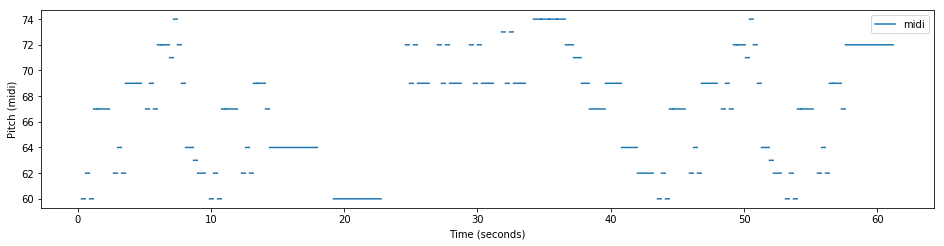

In [13]:
plt.figure(figsize=(16, 8))

plt.subplot(2, 1, 1)
plt.plot(time, pitch_midi, label='midi')
# plt.plot(time, pitch_pyin, label='pyin')
plt.legend()
plt.xlabel('Time (seconds)')
plt.ylabel('Pitch (midi)')
